<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Research-purpose" data-toc-modified-id="Research-purpose-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Research purpose</a></span></li><li><span><a href="#Research-description" data-toc-modified-id="Research-description-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Research description</a></span></li><li><span><a href="#Data-description" data-toc-modified-id="Data-description-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Data description</a></span></li><li><span><a href="#Data-preprocessing" data-toc-modified-id="Data-preprocessing-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Data preprocessing</a></span></li><li><span><a href="#Data-cleaning" data-toc-modified-id="Data-cleaning-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>Data cleaning</a></span><ul class="toc-item"><li><span><a href="#Dictionaries" data-toc-modified-id="Dictionaries-5.1"><span class="toc-item-num">5.1&nbsp;&nbsp;</span>Dictionaries</a></span></li></ul></li><li><span><a href="#Data-analysis" data-toc-modified-id="Data-analysis-6"><span class="toc-item-num">6&nbsp;&nbsp;</span>Data analysis</a></span><ul class="toc-item"><li><span><a href="#Распределение-количества-блокировок-по-госорганам" data-toc-modified-id="Распределение-количества-блокировок-по-госорганам-6.1"><span class="toc-item-num">6.1&nbsp;&nbsp;</span>Распределение количества блокировок по госорганам</a></span></li><li><span><a href="#Распределение-скорости-блокировок:-от-даты-Решения-до-блокировки-2022" data-toc-modified-id="Распределение-скорости-блокировок:-от-даты-Решения-до-блокировки-2022-6.2"><span class="toc-item-num">6.2&nbsp;&nbsp;</span>Распределение скорости блокировок: от даты Решения до блокировки 2022</a></span></li><li><span><a href="#Распределение-скорости-блокировок:-от-даты-Решения-до-блокировки-в-2022" data-toc-modified-id="Распределение-скорости-блокировок:-от-даты-Решения-до-блокировки-в-2022-6.3"><span class="toc-item-num">6.3&nbsp;&nbsp;</span>Распределение скорости блокировок: от даты Решения до блокировки в 2022</a></span></li><li><span><a href="#Распределение-количества-блокировок-по-субъектам-2020-2022" data-toc-modified-id="Распределение-количества-блокировок-по-субъектам-2020-2022-6.4"><span class="toc-item-num">6.4&nbsp;&nbsp;</span>Распределение количества блокировок по субъектам 2020-2022</a></span></li><li><span><a href="#Распределение-количества-блокировок-по-федеральным-округам-2020-2022" data-toc-modified-id="Распределение-количества-блокировок-по-федеральным-округам-2020-2022-6.5"><span class="toc-item-num">6.5&nbsp;&nbsp;</span>Распределение количества блокировок по федеральным округам 2020-2022</a></span></li></ul></li><li><span><a href="#Распределение-блокировок-в-2022-году" data-toc-modified-id="Распределение-блокировок-в-2022-году-7"><span class="toc-item-num">7&nbsp;&nbsp;</span>Распределение блокировок в 2022 году</a></span><ul class="toc-item"><li><span><a href="#Распределение-блокировок-по-субъектам-РФ" data-toc-modified-id="Распределение-блокировок-по-субъектам-РФ-7.1"><span class="toc-item-num">7.1&nbsp;&nbsp;</span>Распределение блокировок по субъектам РФ</a></span></li><li><span><a href="#Распределение-блокировок-по-целевым-областям-исследования" data-toc-modified-id="Распределение-блокировок-по-целевым-областям-исследования-7.2"><span class="toc-item-num">7.2&nbsp;&nbsp;</span>Распределение блокировок по целевым областям исследования</a></span></li><li><span><a href="#Распределение-блокировок-по-целевым-областям-исследования-(кроме-Москвы)" data-toc-modified-id="Распределение-блокировок-по-целевым-областям-исследования-(кроме-Москвы)-7.3"><span class="toc-item-num">7.3&nbsp;&nbsp;</span>Распределение блокировок по целевым областям исследования (кроме Москвы)</a></span></li></ul></li></ul></div>

# Blocking and punishments for words OVD-info

## Research purpose
Censorship research on independent media and public organizations 
Calculate and visualize how many materials and Internet resources in Russia have been blocked since 02/24/2022 under articles on “discrediting" and “fakes", find out what type of data is being blocked. Also try to understand what percentage of the Russian population does not have access to independent information at all (people without access to the Internet and digital TV, etc.). The researchers of OVD-info* will accompany the solution of the problem

## Research description  
Prepare a list of hypotheses to increase revenue of a large online store.
Prioritize hypotheses, run an A/B test and analyze the results.

## Data description  
`roscomsvoboda_data_blocked_2019-2023.csv` structure   
record_id
appearDate
applyDate
authority_id
authority_name
decisionDate
domains
entryType
excludeDate
ips
status
urls
authority_name_red
authority_name_red_topn

In [1]:
import pandas as pd
import datetime 
from datetime import datetime, timedelta
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import scipy.stats as stats
import warnings

warnings.filterwarnings('ignore')
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)  
pd.options.display.max_colwidth = 150 

colors=['cadetblue','steelblue','lavender', 'darkslateblue','lemonchiffon','slateblue','teal', 'mintcream',]

In [2]:
df = pd.read_csv('roscomsvoboda_data_blocked_2019-2023.csv',
                  parse_dates=['appearDate', 'applyDate', 'decisionDate'])

## Data preprocessing

In [3]:
def first_look (df):
    print('------------- First 5 lines ------------')
    display(df.sample(5))
    print('------------- Data types ------------')
    display(df.info())
    print('------------- Gaps ------------')
    for element in df.columns:
        if df[element].isna().any().mean() > 0:
            print(element, '-', df[element].isna().sum())
        else:
            print(element, '- None')
    print('------------- Duplicates ------------')
    if df.duplicated().sum() > 0:
        print(df.duplicated().sum())
    else:
        print('No Duplicates')

In [4]:
first_look(df)

------------- First 5 lines ------------


,record_id,appearDate,applyDate,authority_id,authority_name,decisionDate,domains,entryType,excludeDate,ips,status,urls,authority_name_red,authority_name_red_topn
157803,4598388,2022-07-11,2022-07-01,144,Центральный районный суд г. Новокузнецка - Кемеровская область,2022-06-30,['ekaterina-monastir.ru'],1,NaN,"['172.67.141.219', '2606:4700:3037::ac43:8ddb', '104.21.94.244', '2606:4700:3030::6815:5ef4']",blocked,['https://ekaterina-monastir.ru/bankovskoe-pravo/obmanut-elektroschetchik-na-stolbe-shema.php'],Суд,Суд
235267,5291587,2023-01-13,2023-01-01,22,ФНС,2023-01-11,['rox-official-casinos.ru'],1,NaN,"['172.67.173.223', '2606:4700:3036::ac43:addf', '104.21.30.220', '2606:4700:3037::6815:1edc']",blocked,[],ФНС,ФНС
65530,3470287,2021-07-23,2021-07-01,24,Минкомсвязь,2021-07-22,['filmitorrent.theproxy.link'],5,NaN,"['104.21.51.31', '172.67.220.8', '2606:4700:3032::ac43:dc08', '2606:4700:3031::6815:331f']",blocked,[],Минкомсвязь,Минкомсвязь
19145,2501511,2021-04-19,2020-08-01,24,Минкомсвязь,2020-08-21,['qwerty.zfilm-hd-1240.online'],5,NaN,['209.99.40.222'],blocked,[],Минкомсвязь,Минкомсвязь
155770,4573355,2022-07-02,2022-07-01,5,Генпрокуратура,2022-07-01,['f528.express-wallet.com'],3,NaN,['190.115.18.21'],blocked,[],Генпрокуратура,Генпрокуратура


------------- Data types ------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 267008 entries, 0 to 267007
Data columns (total 14 columns):
 #   Column                   Non-Null Count   Dtype         
---  ------                   --------------   -----         
 0   record_id                267008 non-null  int64         
 1   appearDate               267008 non-null  datetime64[ns]
 2   applyDate                267008 non-null  datetime64[ns]
 3   authority_id             267008 non-null  int64         
 4   authority_name           267008 non-null  object        
 5   decisionDate             267008 non-null  datetime64[ns]
 6   domains                  267008 non-null  object        
 7   entryType                267008 non-null  int64         
 8   excludeDate              31 non-null      object        
 9   ips                      267008 non-null  object        
 10  status                   267008 non-null  object        
 11  urls                     267008 non-null

None

------------- Gaps ------------
record_id - None
appearDate - None
applyDate - None
authority_id - None
authority_name - None
decisionDate - None
domains - None
entryType - None
excludeDate - 266977
ips - None
status - None
urls - None
authority_name_red - None
authority_name_red_topn - None
------------- Duplicates ------------
No Duplicates


## Data cleaning

В исследовании будем рассматривать данные за 2022 год:

In [5]:
df.decisionDate.max()

Timestamp('2023-03-17 00:00:00')

In [6]:
df.rename(columns={'appearDate':'appear_date', 
                   'applyDate':'apply_date', 
                   'decisionDate':'decision_date',
                   'entryType':'entry_type',
                   'excludeDate':'exclude_date',}, inplace=True)
df.columns = df.columns.str.lower()
df['justice_speed'] = (df.appear_date - df.decision_date).apply(lambda x: x.days)
df['authority_name_m'] = df['authority_name'].apply(lambda x: x.lower())
df['decision_year'] = df.decision_date.apply(lambda x: x.year)
df['decision_month'] = df.decision_date.apply(lambda x: x - pd.offsets.MonthBegin())

df.sample()

,record_id,appear_date,apply_date,authority_id,authority_name,decision_date,domains,entry_type,exclude_date,ips,status,urls,authority_name_red,authority_name_red_topn,justice_speed,authority_name_m,decision_year,decision_month
36765,2915420,2021-01-23,2021-01-01,24,Минкомсвязь,2021-01-22,['love.zfilm-hd-2117.online'],5,NaN,"['172.67.207.126', '104.21.42.184']",blocked,[],Минкомсвязь,Минкомсвязь,1,минкомсвязь,2021,2021-01-01


### Dictionaries

In [7]:
# state_dict

state_dict = {'адыге' : 'Республика Адыгея',
             'алта' : 'Республика Алтай',
             'башкорт' : 'Республика Башкортостан',
             'бурят' : 'Республика Бурятия',
             'дагест' : 'Республика Дагестан',
             'ингушет' : 'Республика Ингушетия',
             'кабардин' : 'Кабардино-Балкарская Республика',
             'калмык' : 'Республика Калмыкия',
             'карачаев' : 'Карачаево-Черкесская Республика',
             'карел' : 'Республика Карелия',
             'коми' : 'Республика Коми',
             'крым' : 'Республика Крым',
             'марий' : 'Республика Марий Эл',
             'мордов' : 'Республика Мордовия',
             'саха' : 'Республика Саха (Якутия)',
             'осети' : 'Республика Северная Осетия — Алания',
             'татар' : 'Республика Татарстан',
             'тыв' : 'Республика Тыва',
             'удмур' : 'Удмуртская Республика',
             'хакас' : 'Республика Хакасия',
             'чечен' : 'Чеченская Республика',
             'чуваш' : 'Чувашская Республика — Чувашия',
             'алта' : 'Алтайский край',
             'забайкал' : 'Забайкальский край',
             'камчат' : 'Камчатский край',
             'краснодар' : 'Краснодарский край',
             'краснояр' : 'Красноярский край',
             'перм' : 'Пермский край',
             'примор' : 'Приморский край',
             'ставроп' : 'Ставропольский край',
             'хабар' : 'Хабаровский край',
             'амур' : 'Амурская область',
             'арханг' : 'Архангельская область',
             'астрах' : 'Астраханская область',
             'белгор' : 'Белгородская область',
             'брян' : 'Брянская область',
             'владими' : 'Владимирская область',
             'волгоград' : 'Волгоградская область',
             'вологод' : 'Вологодская область',
             'воронеж' : 'Воронежская область',
             'запорож' : 'Запорожская область',
             'иванов' : 'Ивановская область',
             'иркутск' : 'Иркутская область',
             'калинин' : 'Калининградская область',
             'калуж' : 'Калужская область',
             'кемеро' : 'Кемеровская область — Кузбасс',
             'киров' : 'Кировская область',
             'костром' : 'Костромская область',
             'курган' : 'Курганская область',
             'курск' : 'Курская область',
             'ленинград' : 'Ленинградская область',
             'липецк' : 'Липецкая область',
             'магадан' : 'Магаданская область',
             'москов' : 'Московская область',
             'мурман' : 'Мурманская область',
             'нижегород' : 'Нижегородская область',
             'новгород' : 'Новгородская область',
             'новосиб' : 'Новосибирская область',
             'омск' : 'Омская область',
             'оренбург' : 'Оренбургская область',
             'орлов' : 'Орловская область',
             'пенз' : 'Пензенская область',
             'псков' : 'Псковская область',
             'ростов' : 'Ростовская область',
             'рязан' : 'Рязанская область',
             'самар' : 'Самарская область',
             'саратов' : 'Саратовская область',
             'сахалин' : 'Сахалинская область',
             'свердлов' : 'Свердловская область',
             'смоленс' : 'Смоленская область',
             'тамбов' : 'Тамбовская область',
             'твер' : 'Тверская область',
             'томск' : 'Томская область',
             'тульск' : 'Тульская область',
             'тюмен' : 'Тюменская область',
             'ульянов' : 'Ульяновская область',
             'челяб' : 'Челябинская область',
             'ярослав' : 'Ярославская область',
             'москв' : 'Москва',
             'санкт' : 'Санкт-Петербург',
             'севастопо' : 'Севастополь',
             'еврейск' : 'Еврейская АО',
             'ненец' : 'Ненецкий АО',
             'ханты' : 'Ханты-Мансийский АО — Югра',
             'чукот' : 'Чукотский АО',
             'ямало-ненецк' : '## Data cleaning',
              'мосгорсуд': 'Москва',
              'территории за пределами рф': 'вне рф',
             }

In [8]:
def f(authority_name_m):
    for key in state_dict.keys():
        if key in authority_name_m:
            return state_dict[key]
    return 'Федеральный'
df['state'] =  df['authority_name_m'].apply(f)

In [9]:
# distr_dict

distr_dict_mult = {
    'Центральный ФО' : ['Белгородская область',
                        'Брянская область',
                        'Владимирская область',
                        'Воронежская область',
                        'Ивановская область',
                        'Калужская область',
                        'Костромская область',
                        'Курская область',
                        'Липецкая область',
                        'Московская область',
                        'Орловская область',
                        'Рязанская область',
                        'Смоленская область',
                        'Тамбовская область',
                        'Тверская область',
                        'Тульская область',
                        'Ярославская область',
                        'Москва'],
     'Приволжский ФО': ["Республика Башкортостан",
                        "Республика Марий Эл",
                        "Республика Мордовия",
                        "Республика Татарстан",
                        "Удмуртская Республика",
                        "Чувашская Республика — Чувашия",
                        "Пермский край",
                        "Кировская область",
                        "Нижегородская область",
                        "Оренбургская область",
                        "Пензенская область",
                        "Самарская область",
                        "Саратовская область",
                        "Ульяновская область"],
    
      'Уральский ФО' : ["Курганская область",
                        "Свердловская область",
                        "Тюменская область",
                        "Челябинская область",
                        "Ханты-Мансийский АО — Югра",
                        "Ямало-Ненецкий АО"],
    
       'Северо-Западный ФО' : ["Республика Карелия",
                        "Республика Коми",
                        "Архангельская область",
                        "Вологодская область",
                        "Калининградская область",
                        "Ленинградская область",
                        "Мурманская область",
                        "Новгородская область",
                        "Псковская область",
                        "Санкт-Петербург",
                        "Ненецкий автономный округ"],
    
         'Сибирский ФО' : ["Республика Алтай",
                        "Республика Тыва",
                        "Республика Хакасия",
                        "Алтайский край",
                        "Красноярский край",
                        "Иркутская область",
                        "Кемеровская область — Кузбасс",
                        "Новосибирская область",
                        "Омская область",
                        "Томская область"],
    
      'Дальневосточный ФО' : ["Республика Бурятия",
                        "Республика Саха (Якутия)",
                        "Забайкальский край",
                        "Камчатский край",
                        "Приморский край",
                        "Хабаровский край",
                        "Амурская область",
                        "Магаданская область",
                        "Сахалинская область",
                        "Еврейская автономная область",
                        "Чукотский автономный округ"],
    
      'Южный ФО' : ["Республика Адыгея",
                        "Республика Калмыкия",
                        "Республика Крым",
                        "Краснодарский край",
                        "Астраханская область",
                        "Волгоградская область",
                        "Ростовская область",
                        "Севастополь"],
    
      'Северо-Кавказский ФО' : ["Республика Дагестан",
                        "Республика Ингушетия",
                        "Кабардино-Балкарская Республика",
                        "Карачаево-Черкесская Республика",
                        "Республика Северная Осетия — Алания",
                        "Чеченская Республика",
                        "Ставропольский край"]
             }

In [10]:
distr_dict = {value: key for key, values in distr_dict_mult.items() for value in values}

def f(state):
    for key in distr_dict.keys():
        if key in state:
            return distr_dict[key]
    return 'Федеральный'
df['district'] =  df['state'].apply(f)

In [11]:
display(df.sample(5))

,record_id,appear_date,apply_date,authority_id,authority_name,decision_date,domains,entry_type,exclude_date,ips,status,urls,authority_name_red,authority_name_red_topn,justice_speed,authority_name_m,decision_year,decision_month,state,district
260579,5535626,2023-03-03,2023-03-01,24,Минкомсвязь,2023-03-02,['ok.pandafilm.vip'],5,NaN,"['172.67.209.227', '104.21.93.126', '2606:4700:3033::ac43:d1e3', '2606:4700:3031::6815:5d7e']",blocked,[],Минкомсвязь,Минкомсвязь,1,минкомсвязь,2023,2023-03-01,Федеральный,Федеральный
114204,4123612,2022-03-05,2022-03-01,24,Минкомсвязь,2022-03-04,['w5.v2.lovereads.ru'],5,NaN,['45.88.106.25'],blocked,[],Минкомсвязь,Минкомсвязь,1,минкомсвязь,2022,2022-03-01,Федеральный,Федеральный
206029,5047307,2022-11-08,2022-11-01,632,Октябрьский районный суд г. Уфы - Республика Башкортостан,2022-10-12,['l.wbbizness.com'],1,NaN,['91.228.152.250'],blocked,['https://l.wbbizness.com/'],Суд,Суд,27,октябрьский районный суд г. уфы - республика башкортостан,2022,2022-10-01,Республика Башкортостан,Приволжский ФО
50643,3231408,2022-12-07,2021-05-01,4,Мосгорсуд,2020-12-07,['cs.video.az'],2,NaN,"['104.21.234.56', '104.21.234.57', '2606:4700:3038::6815:ea39', '2606:4700:3038::6815:ea38']",blocked,['http://cs.video.az/movie/serebryanye-konki-2020-hdrip-17772?locale=ru'],Суд,Суд,730,мосгорсуд,2020,2020-12-01,Москва,Центральный ФО
184269,4828006,2022-09-26,2022-09-01,4,Мосгорсуд,2022-02-22,['allserial.sitestreamcouch.com'],2,NaN,"['172.67.197.54', '104.21.58.18', '2606:4700:3033::6815:3a12', '2606:4700:3034::ac43:c536']",blocked,"['http://allserial.sitestreamcouch.com/10766-nochnye-vyzovy-1-als-264.html', 'https://allserial.sitestreamcouch.com/10766-nochnye-vyzovy-1-als-264...",Суд,Суд,216,мосгорсуд,2022,2022-02-01,Москва,Центральный ФО


In [12]:
df21 = df.query('"2022-01-01" >= decision_date >= "2021-01-01"')
df22 = df.query('"2023-01-01" >= decision_date >= "2022-01-01"')

In [13]:
state_list = ['Москва',
'Московская область',
'Владимирская область',
'Калужская область',
'Тверская область',
'Смоленская область',
'Ярославская область',
"Санкт-Петербург",
"Ленинградская область",
"Новгородская область",
"Псковская область"]

state_list_short = ['Москва',
'Московская область',
'Владимирская область',
'Калужская область',
"Санкт-Петербург",
"Ленинградская область",
"Новгородская область",
"Псковская область"]

## Data analysis

In [14]:
df22.authority_name_red_topn.value_counts().to_frame()

,authority_name_red_topn
Суд,45760
ФНС,21503
Генпрокуратура,16518
Other,13387
Минкомсвязь,11983
Роскомнадзор,9439
МВД,4468


### Распределение количества блокировок по госорганам

In [15]:
fig = px.histogram(df22, 
                   y="authority_name_red",
                  color_discrete_sequence=colors,
                  text_auto = '.f')

fig.update_layout(title='Распределение количества блокировок по госорганам 2020-20222 \n', 
                  yaxis_title=None, 
                  xaxis_title='Количество блокировок',
                  yaxis={'categoryorder':'total ascending'},
                  plot_bgcolor='rgba(0,0,0,0)')

### Распределение скорости блокировок: от даты Решения до блокировки 2022

In [16]:
df22_piv = df22.groupby('authority_name_red').agg({'justice_speed':'median'}).sort_values(by = 'justice_speed', ascending = False).reset_index()

fig = px.bar(df22_piv, 
              x='justice_speed',
              y='authority_name_red',
              color_discrete_sequence=colors,
             text_auto = '.f'
             )
fig.update_layout(title='Распределение скорости блокировок: от даты Решения до блокировки\n', 
                  yaxis_title=None, 
                  xaxis_title='Государственный орган',
                  yaxis={'categoryorder':'total ascending'},
                  plot_bgcolor='rgba(0,0,0,0)')

### Распределение скорости блокировок: от даты Решения до блокировки в 2022

In [17]:
df22_piv = df22.groupby(['authority_name_red']).agg({'justice_speed':'median', 'record_id':'nunique'}).sort_values(by = 'record_id', ascending = False).reset_index()

fig = px.bar(df22_piv, 
              x='record_id',
              y='authority_name_red',
              color='justice_speed', 
              color_discrete_sequence=colors, 
              text_auto='.f'
             )
fig.update_layout(title='Распределение количества и скорости блокировок: от даты Решения до блокировки в 2022 году\n', 
                  yaxis_title=None, 
                  xaxis_title='Количество блокировок',
                  yaxis={'categoryorder':'total ascending'},
                  legend=dict(title=None),
                  plot_bgcolor='rgba(0,0,0,0)'
                 )

### Распределение количества блокировок по субъектам 2020-2022 

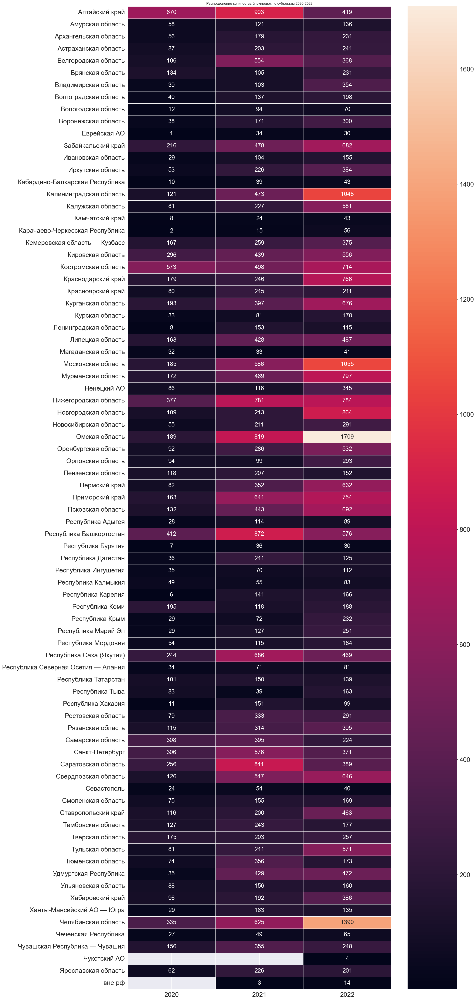

In [18]:
df_court_state = df.query('state != "Федеральный" and state != "Москва" and decision_year != 2023').pivot_table(index = 'state', columns = 'decision_year', values = 'record_id', aggfunc = 'count')

plt.figure(figsize=(20,60))
sns.set(font_scale=2)
fig = sns.heatmap(df_court_state, annot=True, fmt='g', linewidth=.5, annot_kws={"fontsize":20})
sns.set(font_scale=1)
plt.xticks(rotation=0)
fig.set(xlabel=None, ylabel=None)
fig.set_title('Распределение количества блокировок по субъектам 2020-2022');

### Распределение количества блокировок по федеральным округам 2020-2022

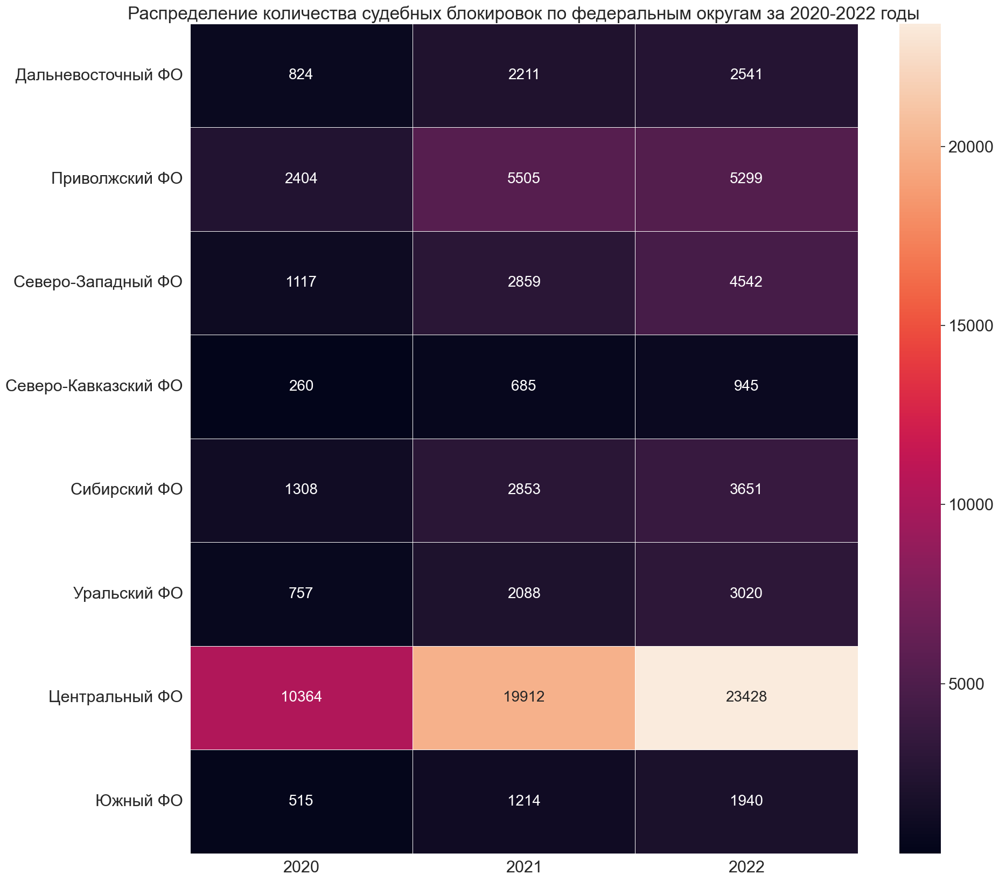

In [19]:
df_court_distr = df.query('district != "Федеральный" and decision_year != 2023').pivot_table(index = 'district', columns = 'decision_year', values = 'record_id', aggfunc = 'count')

plt.figure(figsize=(20,20))
sns.set(font_scale=2)
fig = sns.heatmap(df_court_distr, annot=True, fmt='g', linewidth=.5, annot_kws={"fontsize":20})
plt.xticks(rotation=0)
fig.set(xlabel=None, ylabel=None)
fig.set_title('Распределение количества судебных блокировок по федеральным округам за 2020-2022 годы');

## Распределение блокировок в 2022 году 

### Распределение блокировок по субъектам РФ 

In [20]:
df_state= df22.query('state != "Федеральный"').groupby(['state', 'district']).agg({'record_id':'count'}).sort_values(by = 'record_id', ascending = False).reset_index().head(10)

fig = px.bar(df_state, 
              x='record_id',
              y='state', 
              color='district', 
              color_discrete_sequence=colors, 
              text_auto='.f')

fig.update_layout(title='Распределение судебных блокировок по субьектам РФ за 2022 год\n', 
                  yaxis_title=None, 
                  xaxis_title='Количество блокировок',
                  coloraxis_showscale=False,
                  yaxis={'categoryorder':'total ascending'},
                  legend=dict(yanchor="bottom",
                                y=0,
                                xanchor="right",
                                x=1,
                                title=None),
                  plot_bgcolor='rgba(0,0,0,0)')

### Распределение блокировок по целевым областям исследования

In [21]:
df22_target = df22.query('state in @state_list_short').groupby(['state','decision_month']).agg({'record_id':'count'}).reset_index()

fig = px.line(df22_target, 
              x="decision_month", 
              y="record_id", 
              color='state')

fig.update_layout(title='Распределение блокировок по целевым областям исследования в 2022 году\n', 
                  yaxis_title='Количество блокировок', 
                  xaxis_title = None,
                  legend=dict(
                                yanchor="top",
                                y=1,
                                xanchor="left",
                                x=0,
                                title=None),
                  plot_bgcolor='rgba(0,0,0,0)')

fig.update_xaxes(gridwidth=0.1, gridcolor='lightgrey')
fig.update_yaxes(gridwidth=0.1, gridcolor='lightgrey', range=[0, 2800])

### Распределение блокировок по целевым областям исследования (кроме Москвы)

In [22]:
df22_target_nomos = df22.query('state in @state_list_short and state != "Москва"').groupby(['state','decision_month']).agg({'record_id':'count'}).reset_index()

fig = px.line(df22_target_nomos, 
              x="decision_month", 
              y="record_id", 
              color='state')

fig.update_layout(title='Распределение блокировок по целевым областям исследования в 2022 году (кроме Москвы)\n', 
                  yaxis_title='Количество блокировок', 
                  xaxis_title = None,
                  legend=dict(
                                yanchor="top",
                                y=1,
                                xanchor="left",
                                x=0,
                                title=None),
                  plot_bgcolor='rgba(0,0,0,0)')
    
fig.update_xaxes(gridwidth=0.1, gridcolor='lightgrey')
fig.update_yaxes(gridwidth=0.1, gridcolor='lightgrey')